# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Import-and-setup-data" data-toc-modified-id="Import-and-setup-data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import and setup data</a></div><div class="lev1 toc-item"><a href="#Train-model" data-toc-modified-id="Train-model-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Train model</a></div><div class="lev1 toc-item"><a href="#Test-on-ground-data" data-toc-modified-id="Test-on-ground-data-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Test on ground data</a></div><div class="lev2 toc-item"><a href="#SRRL" data-toc-modified-id="SRRL-31"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>SRRL</a></div><div class="lev2 toc-item"><a href="#Sandia-RTC" data-toc-modified-id="Sandia-RTC-32"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Sandia RTC</a></div><div class="lev2 toc-item"><a href="#ORNL" data-toc-modified-id="ORNL-33"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>ORNL</a></div>

In [170]:
import pandas as pd
import numpy as np
import os
import datetime
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn import tree

import pytz
import itertools
import visualize
import utils
import pydotplus

from sklearn import metrics
from sklearn import ensemble
from sklearn import linear_model

import pvlib
import cs_detection_refactor as cs_detection

import visualize_plotly as visualize

from IPython.display import Image

%load_ext autoreload
%autoreload 2

np.set_printoptions(precision=4)
%matplotlib notebook

import warnings
warnings.filterwarnings('ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Import and setup data

Only making ground predictions using PVLib clearsky model and statistical model.  NSRDB model won't be available to ground measurements.

In [171]:
nsrdb_srrl = cs_detection.ClearskyDetection.read_pickle('srrl_nsrdb_1.pkl.gz')
nsrdb_srrl.df.index = nsrdb_srrl.df.index.tz_convert('MST')
nsrdb_srrl.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')
nsrdb_abq = cs_detection.ClearskyDetection.read_pickle('abq_nsrdb_1.pkl.gz')
nsrdb_abq.df.index = nsrdb_abq.df.index.tz_convert('MST')
nsrdb_abq.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')
nsrdb_ornl = cs_detection.ClearskyDetection.read_pickle('ornl_nsrdb_1.pkl.gz')
nsrdb_ornl.df.index = nsrdb_ornl.df.index.tz_convert('EST')
nsrdb_ornl.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')

# Train model

* Train model on all available NSRBD data
    * ORNL
    * Sandia RTC
    * SRRL

1. Scale model clearsky (PVLib)
2. Calculate training metrics
3. Train model

In [172]:
nsrdb_srrl.scale_model('GHI', 'Clearsky GHI pvlib', 'sky_status')
nsrdb_abq.scale_model('GHI', 'Clearsky GHI pvlib', 'sky_status')
nsrdb_ornl.scale_model('GHI', 'Clearsky GHI pvlib', 'sky_status')

In [173]:
nsrdb_srrl.calc_all_window_metrics(nsrdb_srrl.df, 3, col1='GHI', col2='Clearsky GHI pvlib', overwrite=True)
nsrdb_abq.calc_all_window_metrics(nsrdb_abq.df, 3, col1='GHI', col2='Clearsky GHI pvlib', overwrite=True)
nsrdb_ornl.calc_all_window_metrics(nsrdb_ornl.df, 3, col1='GHI', col2='Clearsky GHI pvlib', overwrite=True)

In [174]:
feature_cols = [
'tfn',
'abs_ideal_ratio_diff',
'abs_ideal_ratio_diff mean',
'abs_ideal_ratio_diff std',
# 'abs_ideal_ratio_diff max',
# 'abs_ideal_ratio_diff min',
# 'abs_ideal_ratio_diff range',
'abs_ideal_ratio_diff gradient',
'abs_ideal_ratio_diff gradient mean',
'abs_ideal_ratio_diff gradient std',
# 'abs_ideal_ratio_diff gradient max',
# 'abs_ideal_ratio_diff gradient min',
# 'abs_ideal_ratio_diff gradient range',
'abs_ideal_ratio_diff gradient second',
'abs_ideal_ratio_diff gradient second mean',
'abs_ideal_ratio_diff gradient second std',
# 'abs_ideal_ratio_diff gradient second max',
# 'abs_ideal_ratio_diff gradient second min',
# 'abs_ideal_ratio_diff gradient second range',
# 'GHI Clearsky GHI pvlib gradient ratio', 
# 'GHI Clearsky GHI pvlib gradient ratio mean', 
# 'GHI Clearsky GHI pvlib gradient ratio std', 
# 'GHI Clearsky GHI pvlib gradient ratio min', 
# 'GHI Clearsky GHI pvlib gradient ratio max', 
# 'GHI Clearsky GHI pvlib gradient ratio range', 
# 'GHI Clearsky GHI pvlib gradient second ratio', 
# 'GHI Clearsky GHI pvlib gradient second ratio mean', 
# 'GHI Clearsky GHI pvlib gradient second ratio std', 
# 'GHI Clearsky GHI pvlib gradient second ratio min', 
# 'GHI Clearsky GHI pvlib gradient second ratio max', 
# 'GHI Clearsky GHI pvlib gradient second ratio range',
'GHI Clearsky GHI pvlib line length ratio',
'GHI Clearsky GHI pvlib line length ratio gradient',
'GHI Clearsky GHI pvlib line length ratio gradient second'
]

target_cols = ['sky_status']

In [175]:
# clf = ensemble.RandomForestClassifier(class_weight='balanced', min_samples_leaf=.004, n_estimators=64, n_jobs=-1)
# clf = ensemble.GradientBoostingClassifier(learning_rate=.001, n_estimators=500)
import xgboost as xgb
# clf = xgb.XGBClassifier(max_depth=4, n_estimators=600, learning_rate=0.0025, nthread=4)
# clf = xgb.XGBClassifier(max_depth=5, n_estimators=200, learning_rate=0.01, min_child_weight=1, nthread=4)
clf = xgb.XGBClassifier(max_depth=4, n_estimators=325, learning_rate=.01, nthread=4, min_child_weight=1)
# clf = xgb.XGBClassifier(max_depth=4, n_estimators=275, learning_rate=.01, nthread=4, min_child_weight=1)
clf = xgb.XGBClassifier(max_depth=4, n_estimators=400, learning_rate=.01, nthread=4, reg_lambda=1)

In [176]:
X = np.vstack((nsrdb_srrl.df[feature_cols].values, 
               nsrdb_abq.df[feature_cols].values,
               nsrdb_ornl.df[feature_cols].values))
y = np.vstack((nsrdb_srrl.df[target_cols].values, 
               nsrdb_abq.df[target_cols].values,
               nsrdb_ornl.df[target_cols].values))

<IPython.core.display.Javascript object>


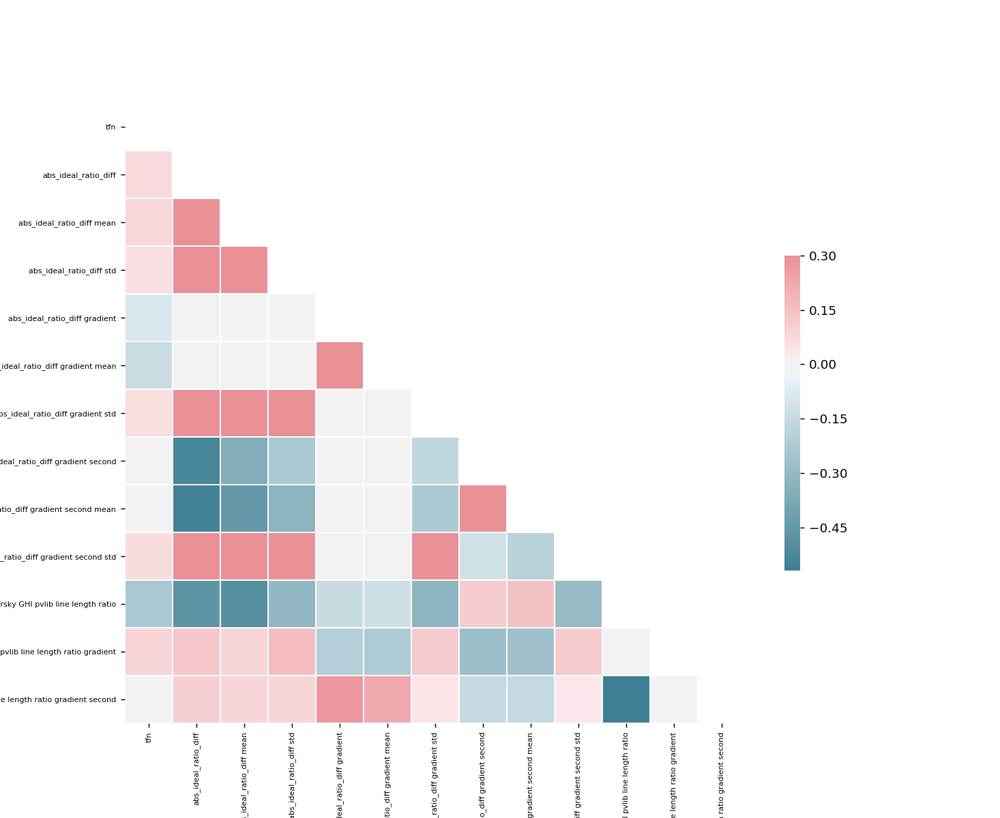

In [177]:
vis = visualize.Visualizer()
vis.plot_corr_matrix(nsrdb_srrl.df[feature_cols].corr().values, labels=feature_cols)

In [178]:
clf.fit(X, y.flatten())

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.01, max_delta_step=0,
       max_depth=4, min_child_weight=1, missing=None, n_estimators=400,
       n_jobs=1, nthread=4, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

# Test on ground data

## SRRL

In [141]:
ground = cs_detection.ClearskyDetection.read_pickle('srrl_ground_1.pkl.gz')

In [142]:
ground.df.index = ground.df.index.tz_convert('MST')

In [143]:
ground.trim_dates('10-01-2010', '10-08-2010')

In [144]:
ground.scale_model('GHI', 'Clearsky GHI pvlib', 'sky_status pvlib')

In [145]:
ground.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')

In [146]:
test = ground

In [147]:
pred = test.iter_predict_daily(feature_cols, 'GHI', 'Clearsky GHI pvlib', clf, 60, smooth=False)
pred = pred.astype(bool)

In [148]:
vis = visualize.Visualizer()

In [149]:
vis.add_line_ser(test.df['GHI'], 'GHI')
vis.add_line_ser(test.df['Clearsky GHI pvlib'], 'GHI_cs')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 0) & (pred)]['GHI'], 'ML clear only')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 1) & (~pred)]['GHI'], 'PVLib clear only')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 1) & (pred)]['GHI'], 'ML+PVLib clear only')
vis.add_line_ser(test.df['abs_ideal_ratio_diff'] * 100, 'ZZZ')

In [150]:
vis.show()

In [151]:
ground = cs_detection.ClearskyDetection.read_pickle('srrl_ground_1.pkl.gz')

In [152]:
ground.df.index = ground.df.index.tz_convert('MST')

In [153]:
ground.trim_dates('10-01-2010', '10-08-2010')

In [154]:
ground.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')

In [155]:
ground.df = ground.df.resample('30T').apply(lambda x: x[len(x) // 2])

In [156]:
test= ground

In [157]:
pred = test.iter_predict_daily(feature_cols, 'GHI', 'Clearsky GHI pvlib', clf, 3, smooth=False)
pred = pred.astype(bool)

In [158]:
vis = visualize.Visualizer()

In [159]:
srrl_tmp = cs_detection.ClearskyDetection(nsrdb_srrl.df)
srrl_tmp.intersection(ground.df.index)
vis.add_line_ser(test.df['GHI'], 'GHI')
vis.add_line_ser(test.df['Clearsky GHI pvlib'], 'GHI_cs')
vis.add_circle_ser(test.df[(srrl_tmp.df['sky_status'] == 0) & (pred)]['GHI'], 'ML clear only')
vis.add_circle_ser(test.df[(srrl_tmp.df['sky_status'] == 1) & (~pred)]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(test.df[(srrl_tmp.df['sky_status'] == 1) & (pred)]['GHI'], 'ML+NSRDB clear only')
vis.add_line_ser(test.df['abs_ideal_ratio_diff'] * 100, 'ZZZ')

In [160]:
vis.show()

## Sandia RTC

In [161]:
ground = cs_detection.ClearskyDetection.read_pickle('abq_ground_1.pkl.gz')

In [162]:
ground.df.index = ground.df.index.tz_convert('MST')

In [163]:
ground.trim_dates('10-08-2015', '10-16-2015')

In [164]:
ground.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')

In [165]:
test = ground

In [166]:
pred = test.iter_predict_daily(feature_cols, 'GHI', 'Clearsky GHI pvlib', clf, 60, smooth=False, tol=1.0e-6)
pred = pred.astype(bool)

In [167]:
vis = visualize.Visualizer()

In [168]:
vis.add_line_ser(test.df['GHI'], 'GHI')
vis.add_line_ser(test.df['Clearsky GHI pvlib'], 'GHI_cs')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 0) & (pred)]['GHI'], 'ML clear only')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 1) & (~pred)]['GHI'], 'PVLib clear only')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 1) & (pred)]['GHI'], 'ML+PVLib clear only')
vis.add_line_ser(test.df['abs_ideal_ratio_diff'] * 100, 'ZZZ')

In [169]:
vis.show()

In [102]:
ground = cs_detection.ClearskyDetection.read_pickle('abq_ground_1.pkl.gz')

In [103]:
ground.df.index = ground.df.index.tz_convert('MST')

In [104]:
ground.trim_dates('10-08-2015', '10-16-2015')

In [105]:
ground.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')

In [106]:
ground.df = ground.df.resample('30T').apply(lambda x: x[len(x) // 2])

In [107]:
test= ground

In [108]:
pred = test.iter_predict_daily(feature_cols, 'GHI', 'Clearsky GHI pvlib', clf, 3, smooth=False)
pred = pred.astype(bool)

In [109]:
vis = visualize.Visualizer()

In [110]:
abq_tmp = cs_detection.ClearskyDetection(nsrdb_abq.df)
abq_tmp.intersection(ground.df.index)
vis.add_line_ser(test.df['GHI'], 'GHI')
vis.add_line_ser(test.df['Clearsky GHI pvlib'], 'GHI_cs')
vis.add_circle_ser(test.df[(abq_tmp.df['sky_status'] == 0) & (pred)]['GHI'], 'ML clear only')
vis.add_circle_ser(test.df[(abq_tmp.df['sky_status'] == 1) & (~pred)]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(test.df[(abq_tmp.df['sky_status'] == 1) & (pred)]['GHI'], 'ML+NSRDB clear only')
vis.add_line_ser(test.df['abs_ideal_ratio_diff'] * 100, 'ZZZ')

In [111]:
vis.show()

## ORNL

In [112]:
ground = cs_detection.ClearskyDetection.read_pickle('ornl_ground_1.pkl.gz')

In [113]:
ground.trim_dates('05-01-2008', '05-08-2008')

In [114]:
ground.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')

In [115]:
ground.scale_model('GHI', 'Clearsky GHI pvlib', 'sky_status pvlib')

In [116]:
test = ground

In [117]:
# pred = clf.predict(test.df[feature_cols].values)
pred = test.iter_predict_daily(feature_cols, 'GHI', 'Clearsky GHI pvlib', clf, 60, smooth=False, tol=1.0e-6)
pred = pred.astype(bool)

In [118]:
vis = visualize.Visualizer()

In [119]:
vis.add_line_ser(test.df['GHI'], 'GHI')
vis.add_line_ser(test.df['Clearsky GHI pvlib'], 'GHI_cs')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 0) & (pred)]['GHI'], 'ML clear only')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 1) & (~pred)]['GHI'], 'PVLib clear only')
vis.add_circle_ser(test.df[(test.df['sky_status pvlib'] == 1) & (pred)]['GHI'], 'ML+PVLib clear only')
vis.add_line_ser(test.df['abs_ideal_ratio_diff'] * 100, 'ZZZ')

In [120]:
vis.show()

In [121]:
ground = cs_detection.ClearskyDetection.read_pickle('ornl_ground_1.pkl.gz')

In [122]:
ground.df.index = ground.df.index.tz_convert('EST')

In [123]:
ground.trim_dates('05-01-2008', '05-08-2008')

In [124]:
ground.time_from_solar_noon('Clearsky GHI pvlib', 'tfn')

In [125]:
ground.df = ground.df.resample('30T').apply(lambda x: x[len(x) // 2])

In [126]:
test= ground

In [127]:
pred = test.iter_predict_daily(feature_cols, 'GHI', 'Clearsky GHI pvlib', clf, 3, smooth=False)
pred = pred.astype(bool)

In [128]:
vis = visualize.Visualizer()

In [129]:
ornl_tmp = cs_detection.ClearskyDetection(nsrdb_ornl.df)
ornl_tmp.intersection(ground.df.index)
vis.add_line_ser(test.df['GHI'], 'GHI')
vis.add_line_ser(test.df['Clearsky GHI pvlib'], 'GHI_cs')
vis.add_circle_ser(test.df[(ornl_tmp.df['sky_status'] == 0) & (pred)]['GHI'], 'ML clear only')
vis.add_circle_ser(test.df[(ornl_tmp.df['sky_status'] == 1) & (~pred)]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(test.df[(ornl_tmp.df['sky_status'] == 1) & (pred)]['GHI'], 'ML+NSRDB clear only')
vis.add_line_ser(test.df['abs_ideal_ratio_diff'] * 100, 'ZZZ')

In [130]:
vis.show()

In [72]:
vis = visualize.Visualizer()
vis.add_bar(feature_cols, clf.feature_importances_)
vis.show()

In [69]:
import pickle

In [70]:
with open('trained_model.pkl', 'wb') as f:
    pickle.dump(clf, f)

In [71]:
with open('trained_model.pkl', 'rb') as f:
    new_clf = pickle.load(f)

In [72]:
new_clf is clf

False

In [73]:
clf.get_params()

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'learning_rate': 0.01,
 'max_delta_step': 0,
 'max_depth': 4,
 'min_child_weight': 1,
 'missing': None,
 'n_estimators': 275,
 'n_jobs': 1,
 'nthread': 4,
 'objective': 'binary:logistic',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'seed': None,
 'silent': True,
 'subsample': 1}

In [74]:
new_clf.get_params()

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'learning_rate': 0.01,
 'max_delta_step': 0,
 'max_depth': 4,
 'min_child_weight': 1,
 'missing': nan,
 'n_estimators': 275,
 'n_jobs': 1,
 'nthread': 4,
 'objective': 'binary:logistic',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'seed': None,
 'silent': True,
 'subsample': 1}